# Street merging and plotting

## Imports

In [38]:
import pandas as pd
import numpy as np
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt
import shapely.wkt
from shapely.geometry import Point
from importnb import Notebook
with Notebook():
    from old_Preprocessing import replace_chars_by_dict, preprocess, map_dict


In [39]:
voies = gpd.read_file("data/voie.zip", encoding='utf-8')
old = gpd.read_file("data/1791.zip", encoding='utf-8')
vass =  gpd.read_file("data/vasserot.zip")

## Dataset manipulations

In [40]:
# open Paris data
# add year
voies["year"] = 2022
# change to EPSG
voies = voies.to_crs(epsg=3857)
# add centroid
voies["centroid"] = voies.centroid

# old Paris data
# change "None" to "" and create long street name
old.iloc[:,1:4] = old.iloc[:,1:4].fillna(value="")
old["l_longmin"] = old["type_voie"] + " " + old["particule"] + " " + old["nom_voie"]
# delete empty lines
mask = old["l_longmin"] != "  "
old = old[mask]
# add year
old["year"] = "1791"
# change to EPSG
old = old.to_crs(epsg=3857)
# add centroid
old["centroid"] = old.centroid

In [41]:
vass

,ROWID,ID_ALPAGE,TYPE,NOM,REF_SCAN,REF_SCAN2,ARTICLE,NOM2_SCAN2,NOM_ENTIER,CODE_FIAB,IDENTIFI,STYLE,CSS_CLASS,EXTRA,geometry
0,1,TR1,Rue,Cloître Notre Dame,ADO75CA_ANO613,None,du,None,Rue du Cloître Notre Dame,1,1,fill:none;stroke:#000000;stroke-opacity:0.7;st...,x1L86,_,"LINESTRING (601078.310 128051.010, 601052.330 ..."
1,2,TR2,Rue,Cloître Notre Dame,ADO75CA_ANO613,None,du,None,Rue du Cloître Notre Dame,1,2,fill:none;stroke:#000000;stroke-opacity:0.7;st...,x1L86,_,"LINESTRING (600968.310 128101.820, 600980.990 ..."
2,3,TR3,Rue,Bossuet,ADO75CA_ANO613,None,None,None,Rue Bossuet,1,3,fill:none;stroke:#000000;stroke-opacity:0.7;st...,x1L86,_,"LINESTRING (601078.310 128051.010, 601090.400 ..."
3,4,TR4,Rue,Chanoinesse,ADO75CA_ANO632,None,None,None,Rue Chanoinesse,1,4,fill:none;stroke:#000000;stroke-opacity:0.7;st...,x1L86,_,"LINESTRING (601071.680 128116.620, 601078.600 ..."
4,5,TR5,Rue,Chantres,ADO75CA_ANO614,None,des,None,Rue des Chantres,1,5,fill:none;stroke:#000000;stroke-opacity:0.7;st...,x1L86,_,"LINESTRING (601071.680 128116.620, 601074.980 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4363,4374,TR4374,Pont,Ièna,ANO061,None,d',ANO 686,None,7,4374,fill:none;stroke:#000000;stroke-opacity:0.7;st...,x1L86,_,"LINESTRING (596659.800 128884.530, 596681.330 ..."
4364,4375,TR4375,Pont,Tournelle,ANO828,ANO638-39,de la,None,None,7,4375,fill:none;stroke:#000000;stroke-opacity:0.7;st...,x1L86,_,"LINESTRING (601421.650 127852.860, 601347.950 ..."
4365,4376,TR4376,Petit Pont,None,ANO631,None,None,None,None,7,4376,fill:none;stroke:#000000;stroke-opacity:0.7;st...,x1L86,_,"LINESTRING (600772.710 128104.540, 600760.660 ..."
4366,4377,TR4377,None,None,ANO184,None,None,None,None,6,4377,fill:none;stroke:#000000;stroke-opacity:0.7;st...,x1L86,_,"LINESTRING (600980.930 131161.470, 600984.620 ..."


In [42]:
# vass Paris data
# change "None" to "" and create long street name
vass.iloc[:,1:4] = vass.iloc[:,1:4].fillna(value="")
vass["l_longmin"] = vass["NOM_ENTIER"]
# delete empty lines
mask = vass["l_longmin"] != "  "
vass = vass[mask]
# add year
vass["year"] = "vass"
# change to EPSG
vass = vass.to_crs(epsg=3857)
# add centroid
vass["centroid"] = vass.centroid

## Preprocessing

In [43]:
# Preprocessing, (! from now on use l_longmin_prep)
old_preprocessed = preprocess(old, "l_longmin", map_dict)
voies_preprocessed = preprocess(voies, "l_longmin", map_dict)

In [44]:

#vass_preprocessed = preprocess(vass, "l_longmin", map_dict)

## Decomposing lists of streets

In [45]:

# list of all streetnames
old_streets = old_preprocessed["l_longmin_prep"]
voies_streets = voies_preprocessed["l_longmin_prep"]

# Find Matching streets
mask = np.isin(old_preprocessed["l_longmin_prep"], voies_preprocessed["l_longmin_prep"])
old_match = old_preprocessed["l_longmin_prep"][mask]

mask = np.isin(voies_preprocessed["l_longmin_prep"], old_preprocessed["l_longmin_prep"])
voies_match = voies_preprocessed["l_longmin_prep"][mask]
# All duplicates in the 1791 data
old_streets = pd.DataFrame(old_streets)
mask = old_streets.duplicated()
all_dup = old_streets[mask].iloc[:,0].unique()

# Decomposing streets
# All streets existing 1791 and 2022 data, with 1791 ambiguity
mask = np.isin(all_dup, old_match)
both_dup = all_dup[mask]
# All streets existing only 1791, with ambiguity
old_dup = all_dup[~mask]

# All streets existing 1791 and 2022, NO ambiguity
mask = np.isin(voies_match, both_dup)
both = voies_match[~mask]

# Streets only in 1791 dataset, NO ambiguity
mask1 = np.isin(old_streets, old_match)
mask2 = np.isin(old_streets, all_dup)
mask = np.logical_or(mask1,mask2)
old_only = old_streets[~mask]

# Streets only in 2022 dataset
mask = np.isin(voies_streets, voies_match)
new_only = voies_streets[~mask]


In [46]:
# Sanity check
len(both_dup) + len(old_dup) + len(old_only) + len(both) - len(old_streets.iloc[:,0].unique())
len(both) + len(new_only) + len(both_dup) - len(voies_streets)

0

In [47]:
mask = vass["l_longmin"].duplicated()
vass[mask]
sum(mask)
vass.groupby("l_longmin", as_index=False).agg({"NOM":list})


,l_longmin,NOM
0,Allée Marboeuf,[Marboeuf]
1,Allée d'Antin,"[Antin, Antin, Antin]"
2,Allée des Veuves,"[Veuves, Veuves, Veuves, Veuves, Veuves, Veuve..."
3,Avenue Lowendal,[Lowendal]
4,Avenue Parmentier,"[Parmentier, Parmentier]"
...,...,...
1312,Ruelle du Vert Buisson,[Vert Buisson]
1313,Sentier de Sainte Périne,"[Sainte Périne, Sainte Périne, Sainte Périne]"
1314,Sentier du Bureau,"[Bureau, Bureau, Bureau]"
1315,passage du Désir,[Désir]


## Creating Dataframes

In [69]:
mask = np.isin(old_preprocessed["l_longmin_prep"], old_only)
dfOldOnly = old_preprocessed[mask].copy()
dfOldOnly["voie_origin"] = "old_only"

mask = np.isin(old_preprocessed["l_longmin_prep"], old_dup)
dfOldDup = old_preprocessed[mask].copy()
dfOldDup["voie_origin"] = "old_dup"  

mask = np.isin(voies_preprocessed["l_longmin_prep"], both_dup)
dfBothDup = voies_preprocessed[mask].copy()
dfBothDup["voie_origin"] = "both_dup"

mask = np.isin(voies_preprocessed["l_longmin_prep"], new_only)
dfNewOnly = voies_preprocessed[mask].copy()
dfNewOnly["voie_origin"] = "new_only"

mask = np.isin(voies_preprocessed["l_longmin_prep"], both)
dfBoth = gpd.GeoDataFrame(voies_preprocessed[mask].copy())
dfBoth.loc["voie_origin"] = "both"

In [71]:
dfBoth = dfBoth.to_crs(epsg=3857)

AttributeError: 'Series' object has no attribute 'to_crs'

In [49]:
dfOldOnly.to_pickle("data/old_only.pkl")
dfOldDup.to_pickle("data/old_dup.pkl")
dfBothDup.to_pickle("data/both_dup.pkl")
dfNewOnly.to_pickle("data/new_only.pkl")
dfBoth.to_pickle("data/both.pkl")

## Visualisation

In [50]:
old.explore()

In [51]:
vass.explore()

In [52]:
voies.explore()

In [70]:
# Going through 23 Streets by hand to see what kind of duplicate it is
# confirmed the first streets (rue des mauvais garcons, rue du renard, rue du platre)
# with Alpage, 1790 dataset

#mask = old_dup["l_longmin_prep"] == "rue du platre"
#dup = old_dup[mask]
dfBoth.explore(edgecolor='k')

AttributeError: 'DataFrame' object has no attribute 'crs'

In [ ]:
centroid_voies_match = gpd.GeoDataFrame(voies_match, geometry = "centroid")
centroid_old_match = gpd.GeoDataFrame(old_match, geometry = "centroid")

In [ ]:
centroid_old_match.explore()

In [ ]:
centroid_voies_match.explore()

In [ ]:
voies_match.explore()

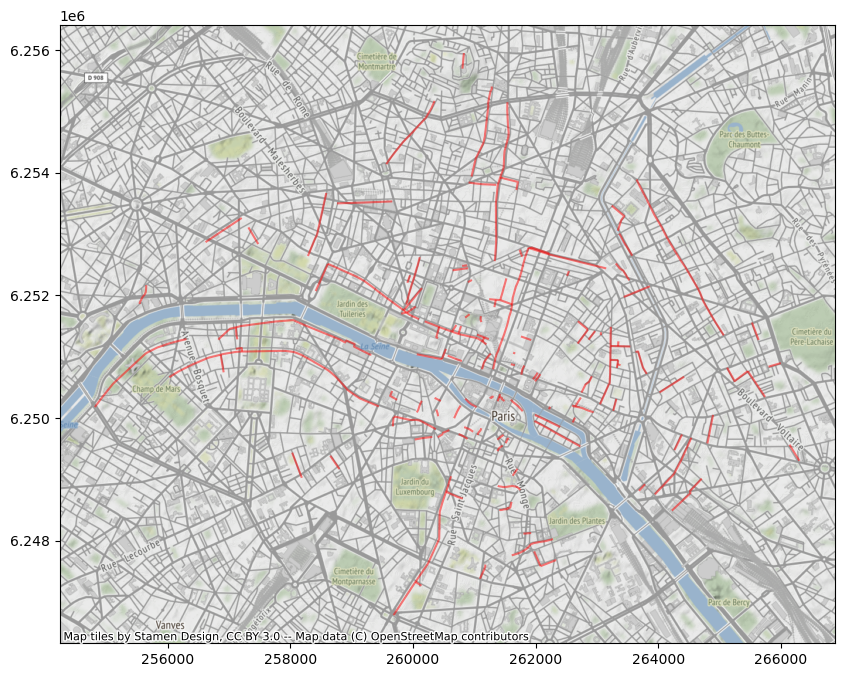

In [63]:
ax = dfOldDup.plot(figsize=(10, 10), alpha=0.5, edgecolor='r')
cx.add_basemap(ax)

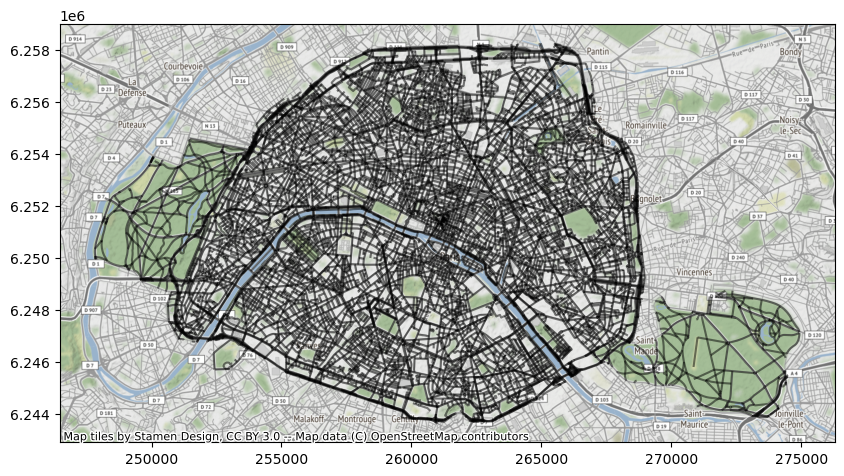

In [ ]:
# Producing the plot
ax = voies.plot(figsize=(10, 10), alpha=0.5, edgecolor='k')
cx.add_basemap(ax)

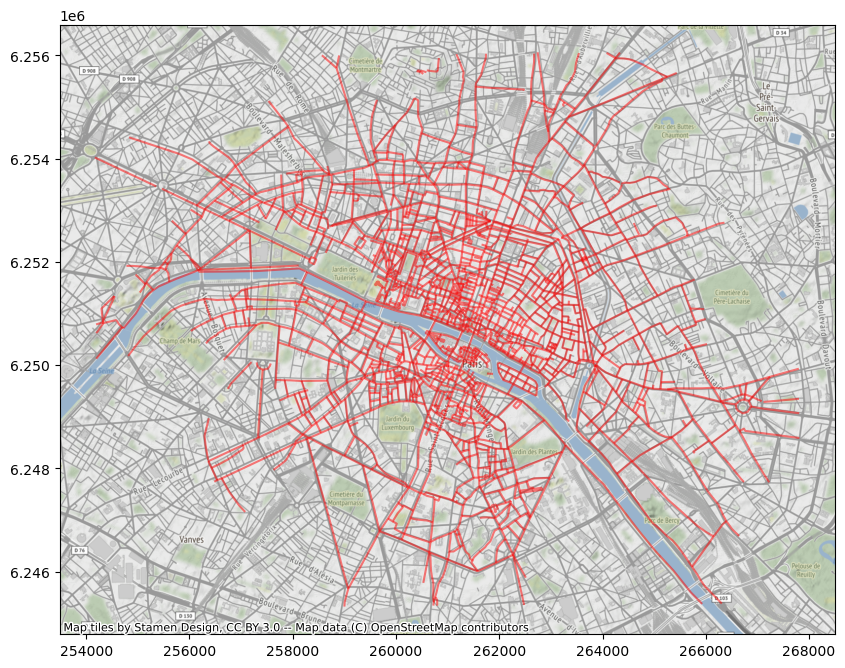

In [ ]:
# Producing the plot
ax = old.plot(figsize=(10, 10), alpha=0.5, edgecolor='r')
cx.add_basemap(ax)

## finding source of strange names (e.g. AW/14 in dfNewOnly)

In [ ]:
dfNewOnly

,n_sq_vo,c_coinsee,c_desi,c_liaison,l_voie,l_courtmin,l_longmin,c_voie,b_fantoir,b_off,c_voie_vp,objectid,c_domoff,n_sq_co,length,geometry,year,centroid,l_longmin_prep,voie_origin
0,750004036.0,75056.0,ALL,D',ANDREZIEUX,All. d'Andrézieux,Allée d'Andrézieux,750560334,O,O,0325,8.0,V,750001537.0,409.388415,"MULTILINESTRING ((261929.132 6256604.215, 2619...",2022,POINT (261945.270 6256633.483),allee d'andrezieux,new_only
1,750004037.0,75056.0,RUE,None,ANDROUET,R. Androuet,Rue Androuet,750560339,O,O,0320,13.0,P,750001537.0,45.836534,"LINESTRING (260320.077 6255463.999, 260324.568...",2022,POINT (260322.701 6255497.741),rue androuet,new_only
3,750004940.0,75056.0,RUE,DE,BUDAPEST,R. de Budapest,Rue de Budapest,750561363,O,O,1358,40.0,P,750001537.0,184.538848,"LINESTRING (259127.586 6253799.493, 259122.592...",2022,POINT (259092.160 6253933.324),rue de budapest,new_only
4,750006171.0,75056.0,RUE,None,PIET MONDRIAN,R. Piet Mondrian,Rue Piet Mondrian,750567481,O,O,7442,67.0,P,750001537.0,54.472693,"LINESTRING (253589.083 6248568.972, 253539.128...",2022,POINT (253564.105 6248535.969),rue piet mondrian,new_only
5,750003276.0,75056.0,RUE,None,JEAN DUNAND,R. Jean Dunand,Rue Jean Dunand,750564880,O,O,4796,74.0,P,750001537.0,58.940768,"LINESTRING (263197.242 6244818.322, 263159.359...",2022,POINT (263169.462 6244852.408),rue jean dunand,new_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6537,750006672.0,75056.0,VOIE,None,DI/19,Voie Di/19,Voie Di/19,75056A783,O,O,Y555,5301.0,P,750001537.0,50.336416,"LINESTRING (265842.047 6258079.918, 265850.032...",2022,POINT (265848.682 6258117.650),voie di/19,new_only
6538,750002181.0,75056.0,VOIE,None,F/11,Voie F/11,Voie F/11,75056X261,O,O,Y261,5312.0,V,750001537.0,80.230058,"LINESTRING (263945.860 6252546.483, 263988.205...",2022,POINT (263967.033 6252489.243),voie f/11,new_only
6539,750000058.0,75056.0,VOIE,None,AW/14,Voie Aw/14,Voie Aw/14,75056A891,N,O,Y712,5335.0,P,750001537.0,184.225896,"LINESTRING (258726.087 6244468.096, 258595.856...",2022,POINT (258592.651 6244508.639),voie aw/14,new_only
6540,750000370.0,75056.0,CHEM,DE LA,CROIX CATELAN,Chem. de la Croix Catelan,Chemin de la Croix Catelan,75056R025,O,O,Z025,5336.0,P,750001537.0,377.531052,"LINESTRING (251045.314 6252171.705, 251044.678...",2022,POINT (251049.795 6251899.141),chemin de la croix catelan,new_only


In [ ]:
voies = gpd.read_file("data/voie.zip", encoding='utf-8')
voies

,n_sq_vo,c_coinsee,c_desi,c_liaison,l_voie,l_courtmin,l_longmin,c_voie,b_fantoir,b_off,c_voie_vp,objectid,c_domoff,n_sq_co,length,geometry
0,750004036.0,75056.0,ALL,D',ANDREZIEUX,All. d'Andrézieux,Allée d'Andrézieux,750560334,O,O,0325,8.0,V,750001537.0,409.388415,"MULTILINESTRING ((2.35295 48.89229, 2.35323 48..."
1,750004037.0,75056.0,RUE,None,ANDROUET,R. Androuet,Rue Androuet,750560339,O,O,0320,13.0,P,750001537.0,45.836534,"LINESTRING (2.33850 48.88555, 2.33854 48.88562..."
2,750005021.0,75056.0,RUE,DES,ANGLAIS,R. des Anglais,Rue des Anglais,750560346,O,O,0327,19.0,P,750001537.0,108.957050,"LINESTRING (2.34823 48.85102, 2.34814 48.85102..."
3,750004940.0,75056.0,RUE,DE,BUDAPEST,R. de Budapest,Rue de Budapest,750561363,O,O,1358,40.0,P,750001537.0,184.538848,"LINESTRING (2.32778 48.87572, 2.32774 48.87584..."
4,750006171.0,75056.0,RUE,None,PIET MONDRIAN,R. Piet Mondrian,Rue Piet Mondrian,750567481,O,O,7442,67.0,P,750001537.0,54.472693,"LINESTRING (2.27803 48.84481, 2.27758 48.84441)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6537,750006672.0,75056.0,VOIE,None,DI/19,Voie Di/19,Voie Di/19,75056A783,O,O,Y555,5301.0,P,750001537.0,50.336416,"LINESTRING (2.38810 48.90100, 2.38817 48.90129..."
6538,750002181.0,75056.0,VOIE,None,F/11,Voie F/11,Voie F/11,75056X261,O,O,Y261,5312.0,V,750001537.0,80.230058,"LINESTRING (2.37107 48.86831, 2.37145 48.86764)"
6539,750000058.0,75056.0,VOIE,None,AW/14,Voie Aw/14,Voie Aw/14,75056A891,N,O,Y712,5335.0,P,750001537.0,184.225896,"LINESTRING (2.32418 48.82056, 2.32301 48.82081..."
6540,750000370.0,75056.0,CHEM,DE LA,CROIX CATELAN,Chem. de la Croix Catelan,Chemin de la Croix Catelan,75056R025,O,O,Z025,5336.0,P,750001537.0,377.531052,"LINESTRING (2.25518 48.86610, 2.25517 48.86600..."


In [ ]:
voies.iloc[6538:6539,:].explore()